# Import e funzioni


In [ ]:
# @title Import

import numpy as np
import matplotlib.pyplot as plt
import imageio
from skimage import data, io, color as col, feature, morphology
from matplotlib.patches import Arc
from IPython.display import HTML
from scipy.ndimage import median_filter
import cv2
from itertools import product
import os
import matplotlib.animation as animation
from mpl_toolkits.mplot3d import Axes3D

In [ ]:
# @title gestione immagini e grafici

#mostra in outuput l' immagine, se necessio grigia e con titolo
def show_img(img,subplot,title=None,asGray=False):
  plt.subplot(subplot)
  if asGray:
    plt.imshow(img,cmap='gray')
  else:
    plt.imshow(img)
  plt.axis('off');
  if title is not None: plt.title(title)

#salvo una gif a partire da un array di frame
def save_file(name, array_frame, fps=2):
    height, width, _ = array_frame[0].shape
    fourcc = cv2.VideoWriter_fourcc(*'XVID')  # You can also try 'H264'
    video = cv2.VideoWriter(name, fourcc, fps, (width, height))

    for frame in array_frame:
        video.write(frame)

    video.release()
    return name


def display_video(name, interval=750,dim=(10,10)):
    try:
        video = imageio.get_reader(name)  # Load video
        fig = plt.figure(figsize=dim)  # Display size specification
        mov = []

        for i, frame in enumerate(video):  # Append videos one by one to mov
            img = plt.imshow(frame, animated=True)
            plt.axis('off')
            mov.append([img])

        # Animation creation
        anime = animation.ArtistAnimation(fig, mov, interval=interval, repeat_delay=1000)
        plt.close(fig)

        return HTML(anime.to_html5_video())

    except Exception as e:
        return f"An error occurred: {e}"


#leggo da file un immagine,eventualmente grigia e/o convertita a valori da 0 a 255
def img_path(path,normalize = False,gray = False):
  img = io.imread(path)
  if (gray): img = col.rgb2gray(img)
  #per evitare problemi, se è in forma float, convertiamo in un range [0,255]
  if normalize: img = img*255;  img = img.astype(int)
  return img

#grafico
def plot_histogram(values,subplot,N=0,color='red',label='Istogramma',title='Istogramma'):
  values = values.copy()
  plt.subplot(subplot)
  bin_edges = np.linspace(0, 256, N + 1) - (256 / (2 * N))
  plt.hist(values.ravel(),
           orientation='vertical',
           density=True, color=color,
           alpha=0.5,
           bins=bin_edges,
           label=label)
  plt.legend(loc='upper right')
  plt.title(title)
  plt.xlabel('valore')
  plt.ylabel('probabilità')

#modifico l' asse Y dell' istogramma
def normalize(arr):
  total = np.sum(arr)
  if total == 0:  #se è vuoto, lo restituisco
        return arr
  return arr / total  #normalizzo

#mostro un grafico
def plot_dynamic_quantization(subplot,hist,plt=plt,N=None,maxs=None,maxs_ranges=None,bin_limits=True,title=None,label='Immagine originaria',color='red',alpha=1):
  plt.subplot(subplot),
  x_values = np.arange(256)
  if N is not None:
    y_values = quantize(x_values,N=N)
  if maxs is not None:
    y_values = quantize(x_values,maxs=maxs)
    N = len(maxs)
  if maxs_ranges is not None:
    y_values = quantize(x_values,maxs_ranges=maxs_ranges)
    bin_limits=False

  plt.plot(x_values, y_values, color='blue', label='quantizzazione flat')
  plt.twiny()
  plt.plot(hist,x_values,
         color=color,
         alpha=alpha,
         label=label)

  if (bin_limits):
    dim_bin = 256/N
    for i in range(N):
      plt.axhline(i*dim_bin, linestyle='dotted',label='bin limits' if i ==0 else None)
      if maxs is None: plt.scatter(hist[int(i * dim_bin)],i * dim_bin, color='orange', label='valori scelti' if i ==0 else None)
      else:plt.scatter(hist[maxs[i]],maxs[i], color='orange',alpha=1, label='massimi' if i ==0 else None)
    plt.axhline(N*dim_bin, linestyle='dotted' )

  plt.legend(loc='upper right')
  if (title): plt.title(title)
  plt.xlabel('Input')
  plt.ylabel('Output')

#mostro grafico
def plot_hist_and_quantization(data,subplot,type_quantization='flat',N=0,color='green',title=None,plt=plt):
  plt.subplot(subplot)
  x_values = np.arange(256)
  if (type_quantization == 'flat'):
    y_values = quantize(x_values,N=N)
    plt.plot(x_values, y_values, color='blue', label='Quantizzazione')
    plt.legend(loc='upper right')
  plt.twiny()
  bin_edges = np.linspace(0, 256, N + 1) - (256 / (2 * N))
  plt.hist(data,
           orientation='horizontal',
           density=True, color=color,
           alpha=0.5,
           bins=bin_edges,
           edgecolor='black',
           label='Istogramma in output')

  plt.legend(loc='upper right')
  if (title): plt.title(title)
  plt.xlabel('Input')
  plt.ylabel('Output')

def generate_frames_hist_3d(matrix,hist_G=None,hist_B=None, N=256):
  max_z = 600# np.percentile(matrix.flatten(), 90)
  images = []
  for R_i in range(N):
    data = matrix[R_i]
    x = np.linspace(0, 255, N).astype(int)
    y = np.linspace(0, 255, N).astype(int)
    X, Y = np.meshgrid(x, y)
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    # Plot the surface
    ax.plot_surface(X, Y, data, cmap='viridis')
    if (hist_G is not None):
      max_value = max([max(hist_B),max(hist_G)])
      scaled_G = [val * max_z / max_value for val in hist_G]
      ax.plot(x, [0]*256, scaled_G, color='green', label='histogram G')
    if (hist_B is not None):
      scaled_B = [val * max_z / max_value for val in hist_G]
      ax.plot([0]*256,y , scaled_B, color='blue', label='histogram B')

    ax.set_xlabel('G values')
    ax.set_ylabel('B values')
    ax.set_zlabel('Probability')
    ax.set_title(f'R ={int(R_i * (256 / N))}')
    ax.set_zlim(0, max_z)
    ax.invert_yaxis()
    # Save the plot as an image directly
    filename = f"plot_R_{R_i}.png"
    plt.savefig(filename)
    plt.close(fig)

    # Read the saved image using OpenCV and append it to the list of frames
    image = cv2.imread(filename)
    images.append(image)
    os.remove(filename)
  return images

def plot_wrong_approssimation(points):
  fig = plt.figure(figsize=(12, 6), facecolor='white')
  axs = [
    fig.add_subplot(131, projection='3d'),
    fig.add_subplot(243),
    fig.add_subplot(247),
    fig.add_subplot(248)
  ]
  aux = fig.add_subplot(244,zorder=-1)
  aux.plot([0, 0], [0, 0])  # Just an example line to make the subplot visible

  #calcolo
  R=quantize(128,maxs_ranges=[p[0] for key, (p, c) in points.items() if key != 'P'])
  G=quantize(128,maxs_ranges=[p[1] for key, (p, c) in points.items() if key != 'P'])
  B=quantize(128,maxs_ranges=[p[2] for key, (p, c) in points.items() if key != 'P'])
  points.update({'NEW': (np.array([R, G, B]), 'grey')})


  # Plot points in the 3D projection
  for key, (p, c) in points.items():
    axs[0].scatter(*p, c=c, s=100)
    #if( key == 'NEW'): continue;
    axs[0].plot([p[0], p[0],0], [0, p[1],p[1]], [0,0,0], c=c)
    axs[0].plot([p[0],p[0]], [p[1],p[1]], [0,p[2]], c=c)
    if( key == 'NEW'): continue;
    aux.add_patch(Arc((0,0), 2 * p[1], 2 * p[1], angle=0, theta1=0, theta2=90, linestyle='--',color=c))

  axs[0].set_xlim([0, 255])
  axs[0].set_ylim([0, 255])
  axs[0].set_zlim([0, 255])

  black_dot = points['P'][0]  # The black dot coordinates
  for key, (point, color) in points.items():
    if( key == 'P'): continue;
    dist = np.linalg.norm(point - black_dot)  # Calculate Euclidean distance
    axs[0].plot([black_dot[0], point[0]], [black_dot[1], point[1]], [black_dot[2], point[2]], c=color, linestyle='--', label=f'{dist:.2f}')

  axs[0].legend(loc='upper left')

  for ax in [axs[1], axs[2], axs[3],aux]:
    ax.set_xlim([0, 255])
    ax.set_ylim([0, 255])

  for key, (p, c) in points.items():
    axs[1].scatter(p[0], p[1], c=c, s=100)
    axs[2].scatter(p[0], p[2], c=c, s=100)
    axs[3].scatter(p[1], p[2], c=c, s=100)
    if( key == 'NEW'): continue;
    axs[1].plot([p[0],p[0],0],[0,p[1],p[1]], c=c, linestyle='--')
    axs[2].plot([p[0],p[0],0],[0,p[2],p[2]], c=c, linestyle='--')
    axs[3].plot([p[1],p[1],0],[0,p[2],p[2]], c=c, linestyle='--')

  axs[1].invert_xaxis()
  axs[0].invert_yaxis()
  axs[2].invert_xaxis()
  axs[2].invert_yaxis()
  axs[3].invert_yaxis()

  axs[1].yaxis.tick_right()
  axs[2].xaxis.tick_top()
  axs[2].yaxis.tick_right()
  axs[3].xaxis.tick_top()

  axs[1].spines['top'].set_visible(False)
  axs[1].spines['left'].set_visible(False)
  axs[2].spines['bottom'].set_visible(False)
  axs[2].spines['left'].set_visible(False)
  axs[3].spines['bottom'].set_visible(False)
  axs[3].spines['right'].set_visible(False)
  aux.spines['top'].set_visible(False)
  aux.spines['right'].set_visible(False)

  axs[0].xaxis.line.set_color('red')
  axs[0].yaxis.line.set_color('green')
  axs[0].zaxis.line.set_color('blue')

  axs[1].spines['bottom'].set_color('red')
  axs[1].spines['right'].set_color('green')
  axs[2].spines['top'].set_color('red')
  axs[2].spines['right'].set_color('green')
  axs[3].spines['left'].set_color('blue')
  axs[3].spines['top'].set_color('green')

  fig.subplots_adjust(.08, .06, .99, .99, 0, 0)

  plt.show()



def plot_palette(colors, subplot):
  normalized_colors = [(R/255, G/255, B/255) for (R, G, B) in colors]
  num_colors = len(colors)
  fig = plt.gcf()
  ax = fig.add_subplot(subplot)
  ax.axis('off')
  ax.set_ylim(0, num_colors)
  for i, c in enumerate(normalized_colors):
    ax.add_patch(plt.Rectangle((0.25, num_colors-i-1), 0.5, 1, color=c))
  ax.add_patch(plt.Rectangle((0.25, 0), 0.5, num_colors, edgecolor='black',fill=False,linewidth=2))
  plt.title(f'Palette di {num_colors} colori')


In [ ]:
# @title immagini grigie

#3 versioni in cui indico insieme a val: N;max;maxs_ranges
def quantize(val,maxs=None,maxs_ranges=None, N=None):
  if isinstance(val,(np.int64,int)):
    if N is not None:
      bin_width = 256 / N
      return (val // bin_width * bin_width).astype(int)
    elif maxs is not None:
      bin_width = 256 / len(maxs)
      return maxs[int(val // bin_width)]
    elif maxs_ranges is not None:
      return find_min_diff(maxs_ranges,val)
  else:
     return np.array([quantize(val=v,maxs=maxs,maxs_ranges=maxs_ranges,N=N) for v in val])
#dato un valore e un array, ritorno il valore più vicino a val (vattori 1d)
def find_min_diff(array,val):
  min = int(256)
  best = None
  for v  in array:
    if (v == -1): continue
    dist = abs(v - val)
    if dist < min:
      min = dist
      best = v
  return int(best)

#FILTRO PERSONALIZZATO
##se trova almeno k valori nei pixel limitrofi, allora approssima
def my_filter(array_2d,size = 1,min_prob = 0.5):
    new = np.copy(array_2d)
    for i in range(0,len(array_2d)):
      for j in range(0,len(array_2d[i])):
        #calcolo i vicini del pixel
        values = find_neighbours(array_2d,i,j,size)
        val,prob,counts = find_best_value(values)
        #se ce ne sono abbastanza dello stesso valore, aggiorno
        if (prob >= min_prob): new[i,j] = val
    return new

#restituisce il pixel che viene ripetuto più volte in un kernel
def find_best_value(array):
    # Conta le occorrenze di ciascun elemento nell'array
    vals, counts = np.unique(array, return_counts=True)
    # Trova l'indice del valore più comune
    i_val = np.argmax(counts)
    # Ottieni il valore più comune e il relativo conteggio
    best_val = vals[i_val]
    best_prob = counts[i_val]
    # Calcola la probabilità relativa
    best_prob = best_prob / len(array)
    return best_val, best_prob, counts

#restituisce un kernel di raggio max_distance
def find_neighbours(image, row, col, max_distance):
    rows =len(image)
    cols =len(image[0])
    neighbors = []
    for i in range(max(0, row - max_distance), min(rows, row + max_distance + 1)):
        for j in range(max(0, col - max_distance), min(cols, col + max_distance + 1)):
            if abs(row - i) + abs(col - j) <= max_distance and (i != row or j != col):
                neighbors.append(image[i,j])
    return neighbors

#indica i pixel che sono diversi, sovrapponendo 2 immagini
def img_diff(img_1,img_2): #prende la dimensione di img_1
  new = np.copy(img_1)
  for i in range(0,len(img_1)):
    for j in range(0,len(img_1[0])):
      new[i,j] = 255 if img_1[i,j]-img_2[i,j] == 0 else 0
  return new

#restiruisco l' istogramma gray, data un immagine
def histogram(img):
  data = img.flatten()
  ris = [0]*256
  for v in data:
    ris[v]+=1
  return ris

#dato un istogramma e un numero di BIN, restiruisce il massimo di ogni BIN
def find_maxs(hist, N):
    maxs = [-1] * N
    dim_bin = 256 // N  # Calcola la dimensione di ciascun bin
    for i in range(N):
        start = i * dim_bin
        end = (i + 1) * dim_bin
        max_index = start + np.argmax(hist[start:end])  # Trova l'indice del massimo all'interno del bin
        if (hist[max_index]> 0): maxs[i] = max_index
    return maxs

In [ ]:
# @title Edge Detection

#calcolo l' edge detection su un immagine a grigi
def edge_detection(img,sigma=1.0,size = 0):
  edges = feature.canny(img, sigma=sigma)#filtro passa alto
  if size > 0: edges = morphology.dilation(edges, morphology.disk(size))
  return  edges

#data un immagine restituita da edge_detection(), aggiunge i bordi a un immagine data in input
def add_edge(img,edge):
  new = np.copy(img)
  for i in range(0,len(img)):
    for j in range(0,len(img[0])):
      if (len(edge) > i and len(edge[0]) > j and edge[i][j] > 0):
        new[i][j] = 0
  return new


def add_edge_RGB(img,edge):
  new = np.copy(img)
  for i in range(0,len(img)):
    for j in range(0,len(img[0])):
      if (len(edge) > i and len(edge[0]) > j and edge[i][j] > 0):
        new[i][j] = (0,0,0)
  return new

In [ ]:
# @title Funzioni per immagini RGB

#converto un immaggine da RGB a GRAY, utilizzando pesi definiti
def img_as_gray(img_RGB):
  R = img_RGB[:,:,0]
  G = img_RGB[:,:,1]
  B = img_RGB[:,:,2]
  return 0.2989 * R + 0.5870 * G + 0.1140 * B

#ricostruisco un immagine a partire da 0<= N <= 3 canali separati
def img_from_channels(R=0,G=0,B=0):
  #se i canali non sono indicati, sono messi a 0
  if (type(R) != int):
    channel = np.zeros((R.shape[0], R.shape[1], 3), dtype=int)
  if (type(G) != int):
    channel = np.zeros((G.shape[0], G.shape[1], 3), dtype=int)
  if (type(B) != int):
    channel = np.zeros((B.shape[0], B.shape[1], 3), dtype=int)

  channel[:, :, 0] = R
  channel[:, :, 1] = G
  channel[:, :, 2] = B
  return channel

#produco una gaussiana in 3d
def gaussian_kernel(size, sigma=1):
    x = np.arange(-size // 2 + 1, size // 2 + 1)
    kernel = np.exp(-x**2 / (2 * sigma**2))
    return kernel / np.sum(kernel)

#costruisco una matrice 3d che descrive un istogramma RGB
def istogram_3d(img,normalize= False,size=256):
  matrix = np.zeros((size, size, size),dtype=int)
  #la popolo
  r,c,channel = img_RGB.shape
  n_pixel = 0
  for i in range(r):
    for j in range(c):
      n_pixel += 1
      p = img[i][j]
      r, g, b = p[0], p[1], p[2]
      #trovo il bin
      r_bin = int(r * (size / 256))
      g_bin = int(g * (size / 256))
      b_bin = int(b * (size / 256))
      matrix[r_bin][g_bin][b_bin] += 1
  if normalize:
    tot_sum = np.sum(matrix)
    matrix /= tot_sum
  return matrix,n_pixel

# conto quanti colori sono utilizzati in un immagine
def used_colors(img):
  colors={}
  for (R,G,B) in img.flatten():
    colors.add((R,G,B))
  return colors

#quantizzazione dei 3 canali in contemporanea
def quantize_3d(val,maxs=None,maxs_ranges=None, N=None,colors=None,lookahead_matrix=None):
  if (len(val)==3):
    R,G,B = val
    if N is not None:
      bin_width = 256 / N;
      R = (R // bin_width * bin_width).astype(int)
      G = (G // bin_width * bin_width).astype(int)
      B = (B // bin_width * bin_width).astype(int)
      return [R,G,B]
    elif maxs is not None:
      bin_width = 256 / len(maxs)
      return maxs[int(R // bin_width)][int(G // bin_width)][int(B // bin_width)]
    elif maxs_ranges is not None:
      if lookahead_matrix is not None and not np.array_equal(lookahead_matrix[R,G,B], [-1, -1, -1]):
        return lookahead_matrix[R,G,B]
      else:
        return find_min_diff_3d(maxs_ranges, val, lookahead_matrix)
    elif colors is not None:
      if lookahead_matrix is not None and not np.array_equal(lookahead_matrix[R,G,B], [-1, -1, -1]):
        return lookahead_matrix[R,G,B]
      else:
        return find_best_color(colors, val, lookahead_matrix)
  else:
    return np.array([quantize_3d(val=v,maxs=maxs,maxs_ranges=maxs_ranges,colors=colors,N=N,lookahead_matrix=lookahead_matrix) for v in val])

#dato un array 3d e una array di vettori 3d, restiruisce il vettore + vicino (in norma 2)
def find_min_diff_3d(dist, val, lookahead_matrix=None):
  X, Y, Z = val
  min = float('inf')
  best = [-1,-1,-1]
  for row in dist:
    for column in row:
      for [R,G,B] in column:
        if np.array_equal([R,G,B], [-1, -1, -1]):continue
        dist = np.sqrt((X-R) ** 2 + (Y-G) ** 2 + (Z-B) ** 2)
        if dist < min:
          min = dist
          best = [R,G,B]
  if lookahead_matrix is not None:
    lookahead_matrix[X, Y, Z] = best
  return best

#dato un array 3d e una array di vettori 3d, restiruisce il vettore + vicino (in norma 2)
def find_best_color(colors, val,lookahead_matrix=None):
  X,Y,Z = val
  min = float('inf')
  best = None
  for [R,G,B] in colors:
  #se il massimo non è valido,skippa
    if np.array_equal([R,G,B], [-1, -1, -1]): continue
    diff = np.sqrt((X-R) ** 2 + (Y-G) ** 2 + (Z-B) ** 2)
    if diff < min:
      min = diff
      best = [R,G,B]
  if (lookahead_matrix is not None): lookahead_matrix[X,Y,Z] = best
  return best

#data una matrice (=istogramma) 3d, calcola i max nei N**3 BIN
def find_maxs_3d(probabilities, N):
    maxs = np.full((N, N, N, 3), -1, dtype=int)
    dim_bin = len(probabilities) // N
    for i in range(N):
        for j in range(N):
            for k in range(N):
                kernel = probabilities[i * dim_bin:(i + 1) * dim_bin,
                                       j * dim_bin:(j + 1) * dim_bin,
                                       k * dim_bin:(k + 1) * dim_bin]
                max_index = np.unravel_index(np.argmax(kernel), kernel.shape)
                R = max_index[0] + i * dim_bin
                G = max_index[1] + j * dim_bin
                B = max_index[2] + k * dim_bin
                # Assegna l'array di 3 int [R, G, B] alla posizione (i, j, k) di maxs, se ce un valore
                if (probabilities[R,G,B] > 0): maxs[i, j, k] = (R, G, B)
    return maxs

# Quantizzazione Lineare


Prendiamo come oggetto di studio l' immagine sottostante, prodotta applicando ad un' immagine RGB la funzione di libreria
> color.rgb2gray(img)

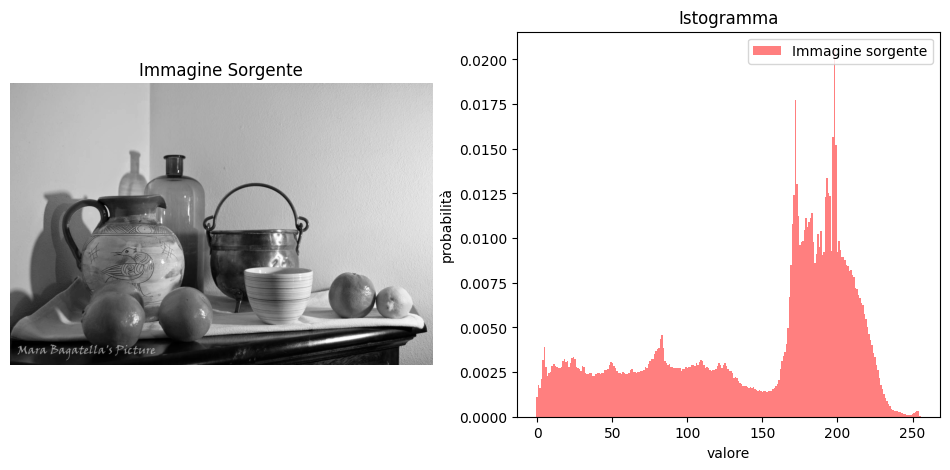

In [ ]:
plt.figure(figsize=(12, 5))
plt.tight_layout()

img_gray = img_path("notebook/img_morta.jpg",normalize=True,gray= True)

show_img(img_gray,121,'Immagine Sorgente',True)
plot_histogram(img_gray,122,256,label='Immagine sorgente')


L'istogramma risultante è definito da un andamento che possiamo riconoscere nell' immagine:

*   I valori da 0 a circa 150 sono il tavolo e gli oggetti
*   I picchi da 150 a 250 sono invece le intensità dello sfondo

Ulteriore conferma la troviamo osservando che è estremamente bassa la probabilità in 255, e infatti l' immagine presenta pochissimi pixel di colore bianco 'puro'.





Proviamo ora a "quantizzare" l' immagine, ovvero limitare a N i valori possibili di ogni pixel.

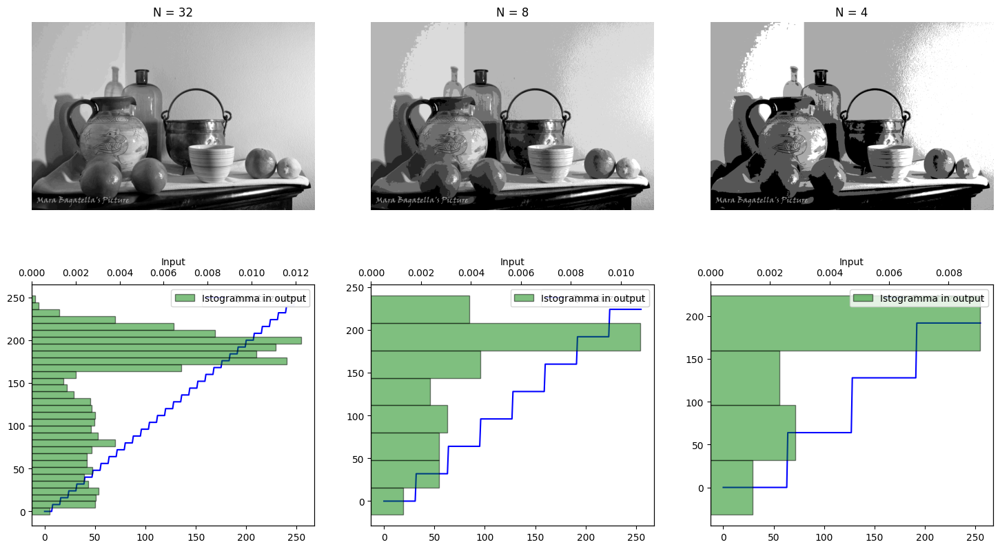

In [ ]:

plt.figure(figsize=(18, 10))
plt.tight_layout()

img_quantized_32 = quantize(img_gray,N=32)
img_quantized_8 = quantize(img_gray,N=8)
img_quantized_4 = quantize(img_gray,N=4)

img_gray_ravel=img_gray.flatten()

#immagini
show_img(img_quantized_32,231,'N = 32',True)
show_img(img_quantized_8, 232,'N = 8' ,True)
show_img(img_quantized_4, 233,'N = 4' ,True)

#hist+plot
plot_hist_and_quantization(img_gray_ravel,234, N=32)
plot_hist_and_quantization(img_gray_ravel,235, N=8 )
plot_hist_and_quantization(img_gray_ravel,236, N=4 )


Riducendo in modo esponenziale il numero di bin, notiamo che comunque l' istogramma mantiene la sua coerenza.<br>
Si Noti come nonostante la riduzione del numero dei valori, possiamo ancora comunque andare a riconoscere le forme degli oggetti, soprattutto dove i bordi erano ben definiti.<br>
Al contrario, lo sfondo risulta gravemente compromesso, in quanto possiamo andare a vedere una separazione troppo netta in alcuni punti.<br>
La linea in blu rappresenta la "funzione di trasformazione":

*   è crescente su tutto il dominio
*   è una funzione totale
*   è caratterizzata da N scalini di lunghezza e altezza costante
*   utilizzando un numero bin pari alla cardinalità del dominio (256) nel nostro caso, poco sorprendentemente otterremmo la funzione identità descritta dalla bisettrice


In [ ]:
N_values = list([256,128,64,32,16])+list(range(16,1,-1))
frames = []
#creo i frame
for i, N in enumerate(N_values, start=1):
    show_img(quantize(img_gray,N=N), 121, f'N = {N}', True)
    plot_hist_and_quantization(img_gray_ravel, 122, N=N)
    plt.tight_layout()
    plt.savefig(f'frame_{i:03d}.png')
    frames.append(cv2.imread(f'frame_{i:03d}.png'))
    os.remove(f'frame_{i:03d}.png')
    plt.close()

#creo e visualizzo
nome_video = 'notebook/quantizzazione lineare 1d.mp4'
display_video(save_file(nome_video,frames),dim=(12,5))



# Enhancing e edge detection


Prendiamo ora come esempio l' immagine con 6 BIN, e andiamo a studiarla per poterla migliorare.

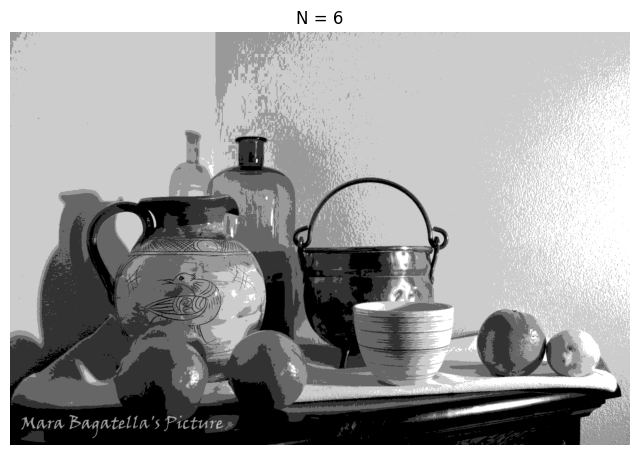

In [ ]:
plt.figure(figsize=(8,8))

img_quantized_6 = quantize(img_gray,N=6)

show_img(img_quantized_6, 111,'N = 6' ,True)


Proviamo a concentrarci ora sull' effetto "spray" ottenuto sui muri:<br>
questo è causato dall' intensità del muro, che ricade in più bin distinti.<br>
Per questo motivo, pixel che sono "vicini" dal punto di vista geografico (e anche dal punto di vista dell' intensità), vengono separati.

Per risolvere questo problema, proviamo ad applicare dei filtri (passa basso) a posteriori, e vediamo come viene modificata l'immagine.


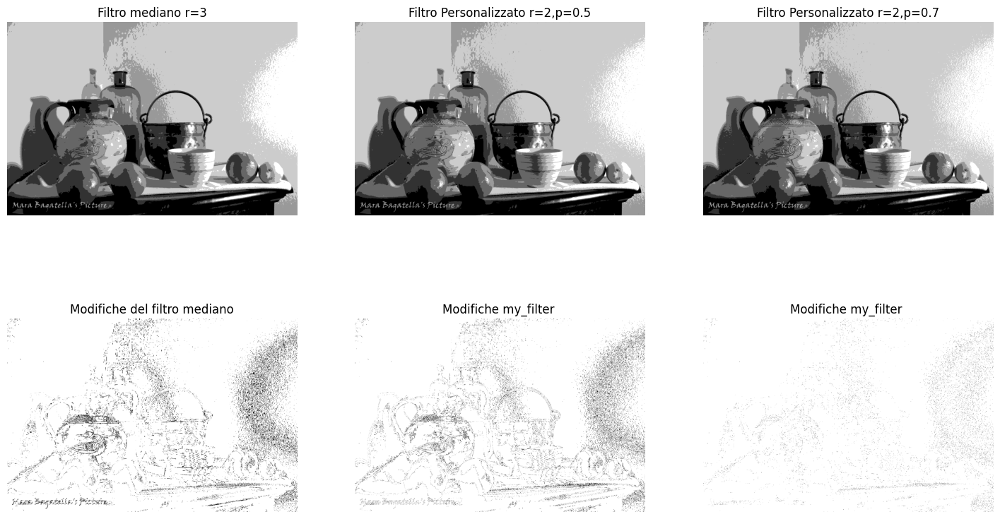

In [ ]:
plt.figure(figsize=(18, 10))
plt.tight_layout()

r=2; p1=0.5; p2 = 0.7
img_median = median_filter(img_quantized_6,size=r*2+1)
img_my_filter_p1 = my_filter(img_quantized_6,r,p1)
img_my_filter_p2 = my_filter(img_quantized_6,r,p2)

show_img(img_median,       231,'Filtro mediano r=3' ,True)
show_img(img_my_filter_p1, 232,f'Filtro Personalizzato r={r},p={p1}' ,True)
show_img(img_my_filter_p2, 233,f'Filtro Personalizzato r={r},p={p2}' ,True)


show_img(img_diff(img_median,img_quantized_6),       234,'Modifiche del filtro mediano' ,True)
show_img(img_diff(img_my_filter_p1,img_quantized_6), 235,'Modifiche my_filter ' ,True)
show_img(img_diff(img_my_filter_p2,img_quantized_6), 236,'Modifiche my_filter ' ,True)


Come possiamo notare, il filtro mediano con kernel di di r=3 va a togliere fin troppe dettagli, come ad esempio l' uccello dal vaso.

Il filtro personalizzato con un kernel delle stesse dimensioni va a invece a fare un lavoro leggermente migliore, andando a rimuovere l' effetto spray ma mantenendo l' uccello.

Il tempo di esecuzione di my_filter è molto elevato a causa dell' elevato numero di calcoli che deve fare:

* controllo i valori dei pixel vicini, fino a una distanza r
* se un valore x viene rappresentato con probabilità almeno p, allora il pixel studiato assume il valore x


Proviamo ora a provare a calcolare i bordi dell' immagine, effettuando una edge detection.

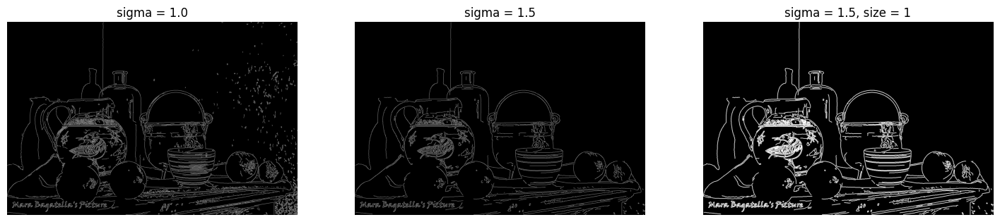

In [ ]:
plt.figure(figsize=(18, 5))
plt.tight_layout()

img_gray_not_normalized = img_path("notebook/img_morta.jpg",gray= True)

edge_default  = edge_detection(img_gray_not_normalized)
edge_enhanced = edge_detection(img_gray_not_normalized,sigma=1.5)
edge_thicker  = edge_detection(img_gray_not_normalized,sigma=1.5,size=1)

show_img(edge_default,  131,'sigma = 1.0' ,True)
show_img(edge_enhanced, 132,'sigma = 1.5' ,True)
show_img(edge_thicker,  133,'sigma = 1.5, size = 1' ,True)


Il codice utilizzato per la "edge detection" è il seguente:<br>

```
def edge_detection(img,sigma=1.0,size = 0):
  blurred = cv2.GaussianBlur(src=img, ksize=(3, 5), sigmaX=0.5)
  edges = feature.canny(blurred, sigma=sigma)
  if size > 0: edges = morphology.dilation(edges, morphology.disk(size))
  return  edges
```



1.   Applichiamo un filtro "passa basso" per rimuovere il rumore (altrimenti saranno riconosciuti troppi edge)
2.   Applichiamo un filtro "passa alto" per riconoscere le repentine variazioni di intensità, ovvero i contorni delle immagini
3.   Se indicato, "inspessiamo" i bordi calcolati per renderli più visibili


Si noti come al crescere del parametro sigma, la funzione alzi il "limite di threshold" al di sotto del quale un edge non è più riconosciuto come tale.


Applichiamo ora i risultati all' immagine scelta (ovvero il risultato del my_filter con p=0.5).

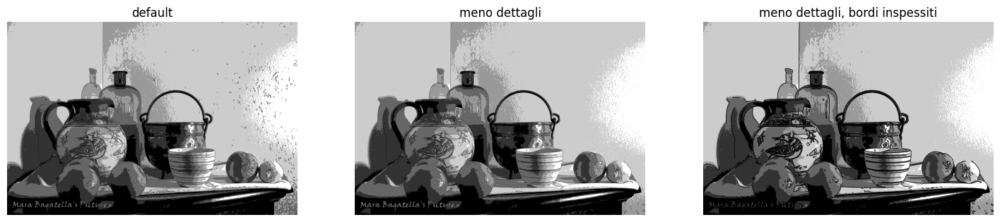

In [ ]:
plt.figure(figsize=(18, 5))
plt.tight_layout()
img_my_filter = img_my_filter_p1
img_quantized_6_edge = add_edge(img_my_filter,edge_thicker)

show_img(add_edge(img_my_filter,edge_default),  131,'default' ,True)
show_img(add_edge(img_my_filter,edge_enhanced), 132,'meno dettagli' ,True)
show_img(img_quantized_6_edge,                  133,'meno dettagli, bordi inspessiti' ,True)

Prendiamo in esame l' ultima immagine ottenuta, e paragoniamola all' originale.

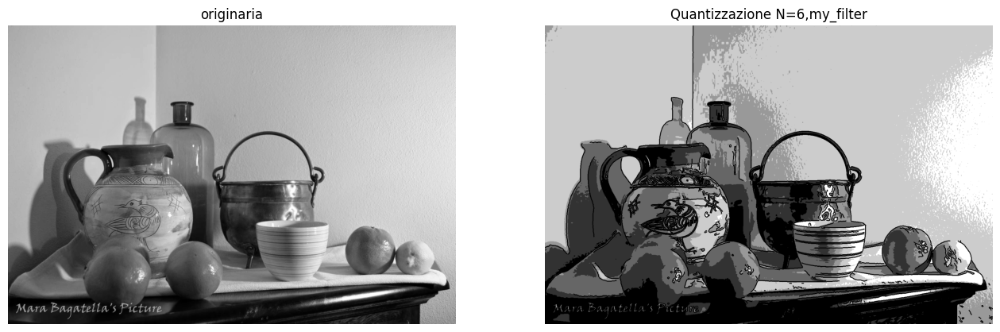

In [ ]:
plt.figure(figsize=(16, 5))
plt.tight_layout()

show_img(img_gray,             121,'originaria' ,True)
show_img(img_quantized_6_edge, 122,'Quantizzazione N=6,my_filter' ,True)

Come possiamo notare, la quantizzazione delle intensità **NON** rispecchia quelle in input, anzi va a ignorarle:

indipendentemente dall' immagine iniziale, sceglie dei "rappresentanti" dei bin in modo costante.   

# Quantizzazione variabile


Prendiamo ora una nuova immagine, con intensità che rendono ancora piu evidente il problema:

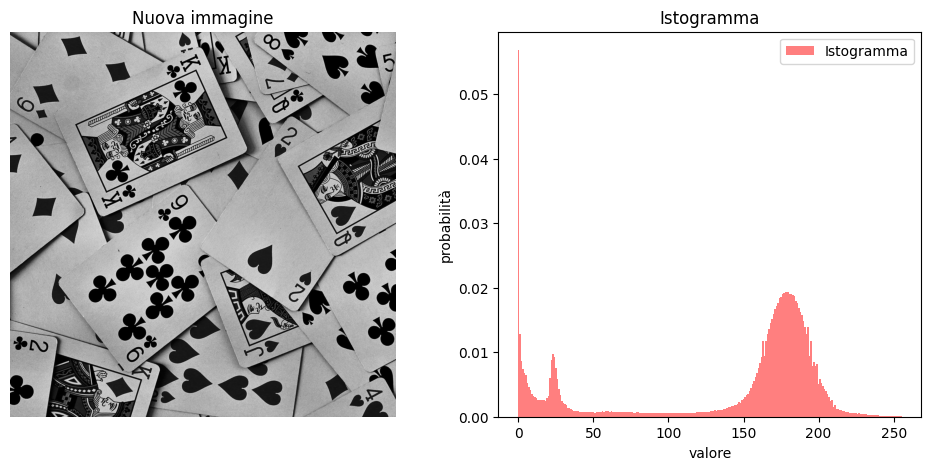

In [ ]:
plt.figure(figsize=(12, 5))
plt.tight_layout()

img_gray = img_path("notebook/carte.jpg",normalize= True,gray= True)

show_img(img_gray, 121,'Nuova immagine' ,True)

plot_histogram(img_gray,122,256)



Come possiamo vedere, l' istogramma ha un andamento bimodale:<br>
è molto presente il valore 0 (nero,delle figure) e il valore 190 (grigio della carta).

Il valore 35 è dato dal rosso delle carte, convertito in grigio dalla funzione.

Andiamo a effettuare una Quantizzazione Lineare, ad esempio con N=4.

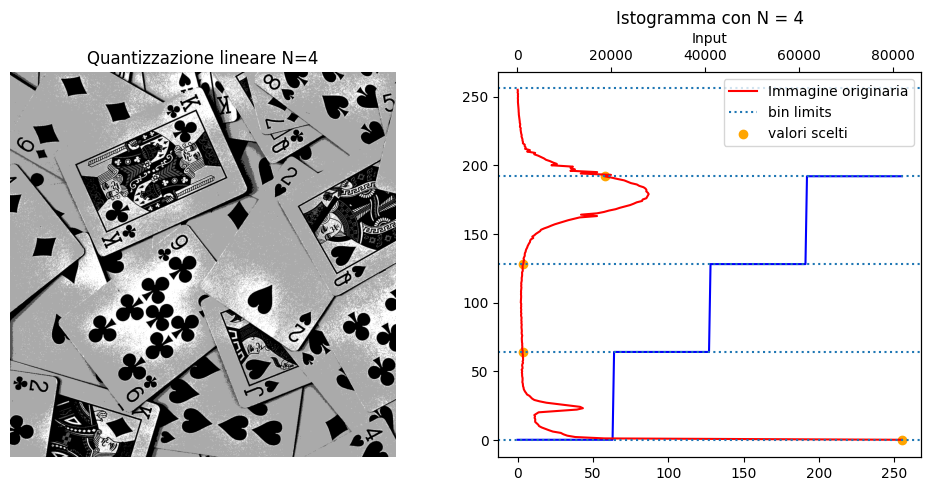

In [ ]:
# @title Quantizzazione lineare N=4
plt.figure(figsize=(12, 5))
plt.tight_layout()

N = 4
hist = histogram(img_gray)

img_quantized_flat = quantize(img_gray,N=N)

show_img(img_quantized_flat, 121,f'Quantizzazione lineare N={N}' ,True)
plot_dynamic_quantization(122,hist,N=N,title=f'Istogramma con N = {N}')

Come possiamo vedere, i bin vengono approssimati a valori fissi, e possiamo notare come le carte contengano delle sfumature che sono nettamente separate.

Per rimuovere questo fastidioso effetto, proviamo a scegliere i rappresentanti dei bin in modo che siano i valori più "probabili" all' interno del bin.

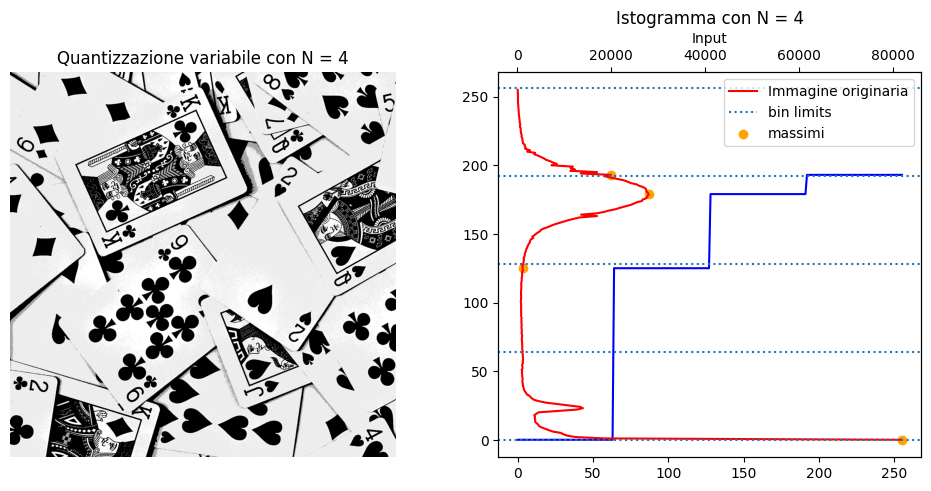

In [ ]:
# @title Quantizzazione variabile

plt.figure(figsize=(12, 5))
plt.tight_layout()

maxs=find_maxs(hist,N)

img_quantized_maxs = quantize(img_gray,maxs=maxs)

show_img(img_quantized_maxs, 121,f'Quantizzazione variabile con N = {N}' ,True)
plot_dynamic_quantization(122,hist,maxs=maxs,title=f'Istogramma con N = {N}')

Come possiamo notare, l' approssimazione risulta più "azzeccata".

Mettendo a confronto le immagini, osserviamo un miglioramento.

Il cambio di colore delle carte è ovviamente dato dalla quantizzazione:<br>passando da 256 a 4 colori ovviamente andiamo a perdere dettagli.


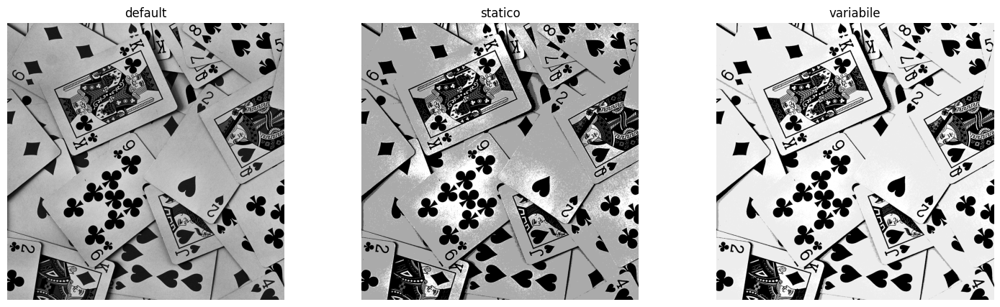

In [ ]:
# @title Confronto tra tecniche
plt.figure(figsize=(18, 5))
plt.tight_layout()

show_img(img_gray,           131,'default' ,True)
show_img(img_quantized_flat, 132,'statico',True)
show_img(img_quantized_maxs, 133,'variabile',True)


# Quantizzazione dinamica

A questo punto possiamo chiederci cosa succeda mantenendo fisso il numero di "scalini", ma rendendo variabile la lunghezza e l' altezza di ognuno (ovvero calcoliamo a runtime la dimensione di ogni bin e il realtivo rappresentante).

Lavoriamo in questo modo:
*   Suddivido il dominio in N bin di dimensione uguale
*   Per ogni bin trovo il rappresentante (valore più probabile)
*   Approssimo ogni valore al suo rappresentante più vicino

Riprendiamo ora l' immagine della natura morta con N=6, e vediamo se possiamo migliorarne l' approssimazione.

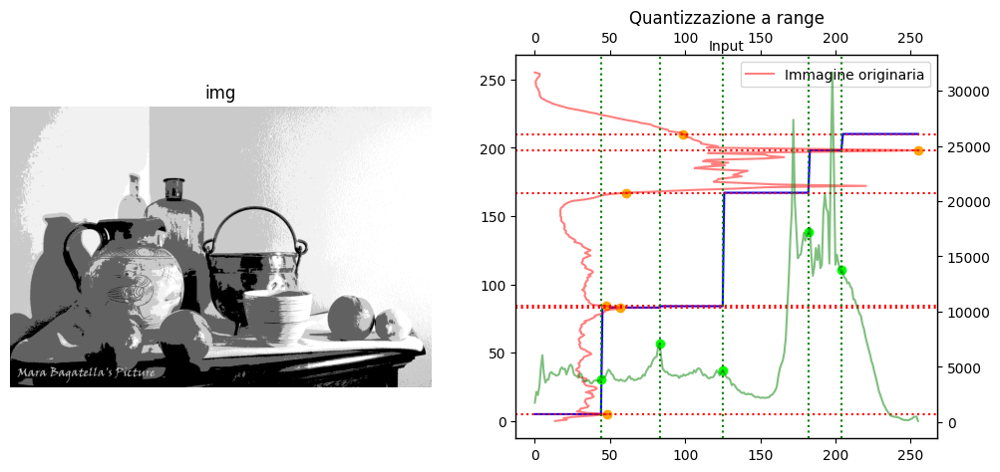

In [ ]:

plt.figure(figsize=(12, 5))
img_gray = img_path("notebook/img_morta.jpg",normalize= True,gray= True)
hist = histogram(img_gray)

N=6
maxs=find_maxs(hist,N)

plt.subplot(121)
img_quantized_maxs_range = quantize(img_gray,maxs_ranges=maxs)

show_img(img_quantized_maxs_range, 121,'img',True)
plot_dynamic_quantization(122,hist,maxs_ranges=maxs,title=f'Quantizzazione a range',alpha= 0.5)

##add line to plot
for i,m in enumerate(maxs):
  plt.axhline(m,color='red', linestyle='dotted',label='max' if i==1 else None)
  plt.scatter(hist[m],m, color='orange', label='valori scelti' if i ==1 else None)

plt.gca().set_xticks([])

plt.twiny()
plt.twinx()
plt.plot(np.arange(256),hist,
         color='green',
         alpha=0.5,
         label='Immagine originaria')

for i in range(len(maxs)-1):
  x_slice = int((maxs[i]+maxs[i+1])/2)
  plt.axvline(x_slice,color='green', linestyle='dotted')
  plt.scatter(x_slice,hist[x_slice], color='lime')


Come possiamo notare, abbiamo ad esempio uniformato il piu possibile il muro, come potevamo osservarare nell' immagine originaria.

Questo lo possiamo notare grazie al fatto che 2 rappresentanti sono posti molto vicini tra loro: in questo modo è come se avessimo "esteso" il range del bin che descrive il muro, evitando problemi come in precedenza.



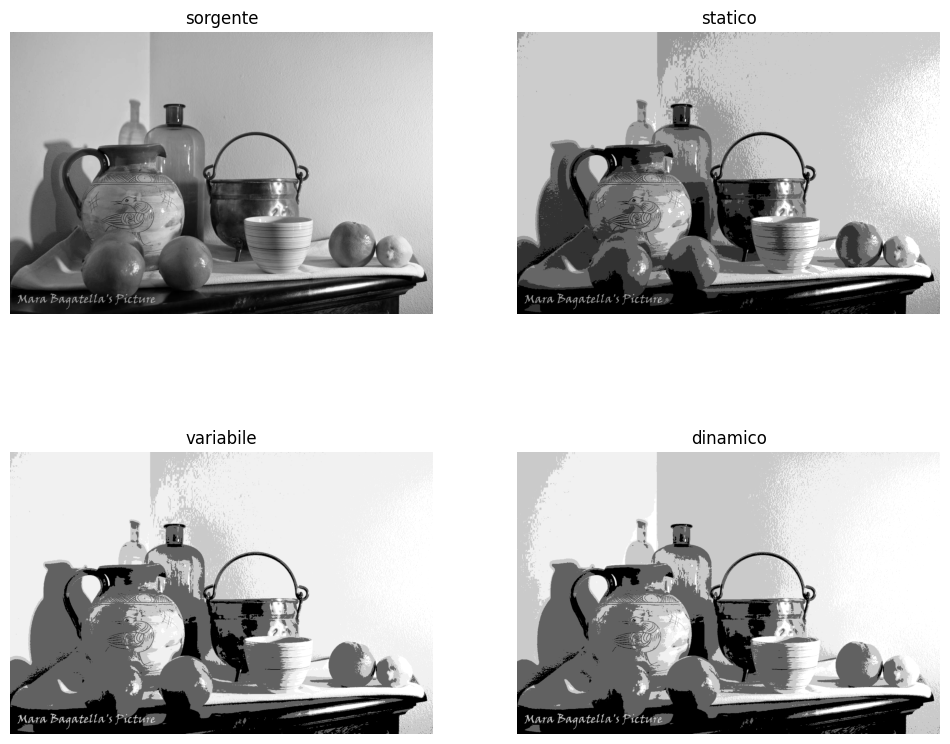

In [ ]:
# @title Confronto FInale
img_gray = img_path("notebook/img_morta.jpg",normalize= True,gray= True)
hist = histogram(img_gray)

N=6
maxs=find_maxs(hist,N)

img_quantized_flat = quantize(img_gray,N=N)
img_quantized_maxs = quantize(img_gray,maxs=maxs)
img_quantized_maxs_range = quantize(img_gray,maxs_ranges=maxs)

plt.figure(figsize=(12,10))
plt.tight_layout()

show_img(img_gray,                 221,'sorgente',True)
show_img(img_quantized_flat,       222,'statico',True)
show_img(img_quantized_maxs,       223,'variabile',True)
show_img(img_quantized_maxs_range, 224,'dinamico' ,True)

# Quantizzazioni RGB con studio separato

Proviamo ora a lavorare in 3 dimensioni:<br>
riprendiamo l' immagine della natura morta, ma a colori.

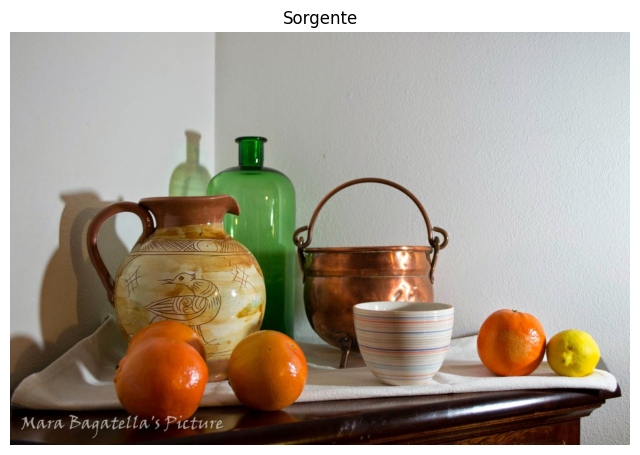

In [ ]:
plt.figure(figsize=(8,8))

img_RGB = img_path("notebook/img_morta.jpg",normalize= False).astype(int)

show_img(img_RGB, 111,'Sorgente')


Inanzitutto andiamo a visualizzare la distribuzione degli istrogrammi, separatamente R,G,B.

Si noti come sommandoli con dei pesi<br>
Y = 0.2989 ⋅ R + 0.5870 ⋅ G + 0.1140 ⋅ B

si ottenga l' istogramma per le tonalità di grigio (i pesi sono gli stessi utlizzati dalla funzione di libreria color.rgb2gray).

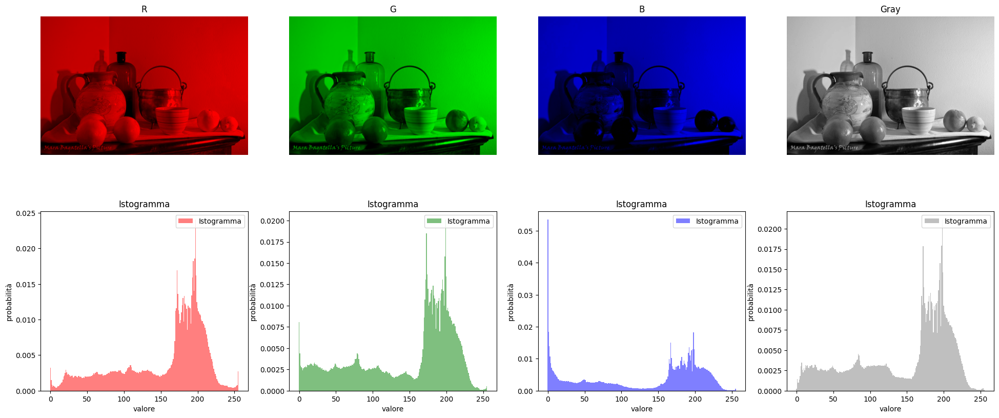

In [ ]:
plt.figure(figsize=(24,10))

R = img_RGB[:,:,0]
G = img_RGB[:,:,1]
B = img_RGB[:,:,2]

img_gray = img_as_gray(img_from_channels(R=R,G=G,B=B))

show_img(img_from_channels(R=R), 241,'R')
show_img(img_from_channels(G=G), 242,'G')
show_img(img_from_channels(B=B), 243,'B')
show_img(img_gray, 244,'Gray',asGray=True)

plot_histogram(R,245,N=256,color='red')
plot_histogram(G,246,N=256,color='green')
plot_histogram(B,247,N=256,color='blue')
plot_histogram(img_gray,248,N=256,color='gray')

Proviamo a quantizzare in modo separato i 3 canali, con la "Quantizzazione Lineare".

In [ ]:
N_values = list([256,128,64,32,16])+list(range(16,1,-1))
frames = []
#creo i frame
for i, N in enumerate(N_values, start=1):
    plt.figure(figsize=(6,5))
    show_img(img_from_channels(
        R=quantize(R,N=N),
        G=quantize(G,N=N),
        B=quantize(B,N=N)
        ), 111, f'N = {N}', True)
    plt.savefig(f'frame_{i:03d}.png')
    frames.append(cv2.imread(f'frame_{i:03d}.png'))
    os.remove(f'frame_{i:03d}.png')
    plt.close()

#creo e visualizzo
nome_video = 'notebook/RGB quantizzazione lineare.mp4'
display_video(save_file(nome_video,frames),dim=(6,5))


Mettiamo ora a paragone i risultati, al variare delle tecniche utilizzate.

Suddividiamo in 4 range ogni asse, per un totale di 64 bin.

Per semplicità è riportato solo l' istogramma del canale R, e in modo analogo lavoriamo sui restanti 2.

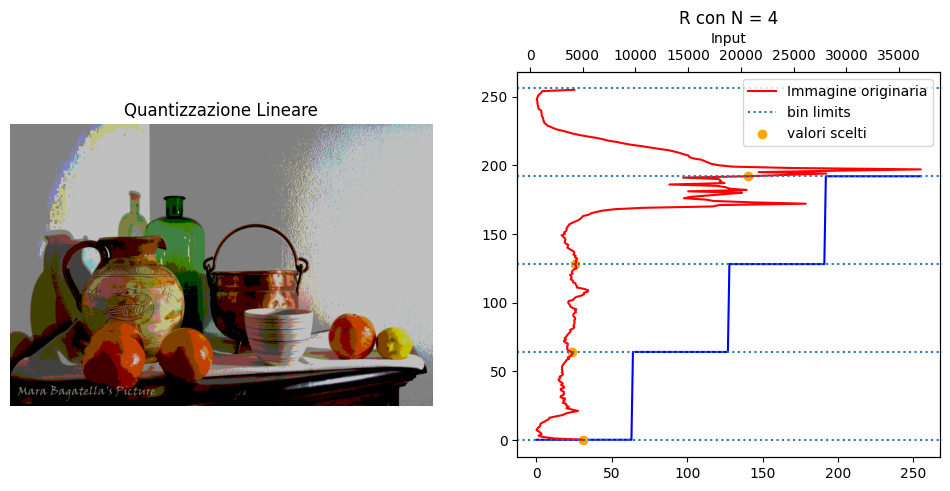

In [ ]:
N = 4
plt.figure(figsize=(12,5))

hist_R = histogram(R)
hist_G = histogram(G)
hist_B = histogram(B)

img_flat_separate = img_from_channels(
        R=quantize(R,N=N),
        G=quantize(G,N=N),
        B=quantize(B,N=N)
        )

show_img(img_flat_separate, 121,'Quantizzazione Lineare')

plot_dynamic_quantization(122,hist_R,N=N,title=f'R con N = {N}',color='red')

Come detto in precedenza, con una quantizzazione variabile dovremmo poter osservare dei miglioramenti.

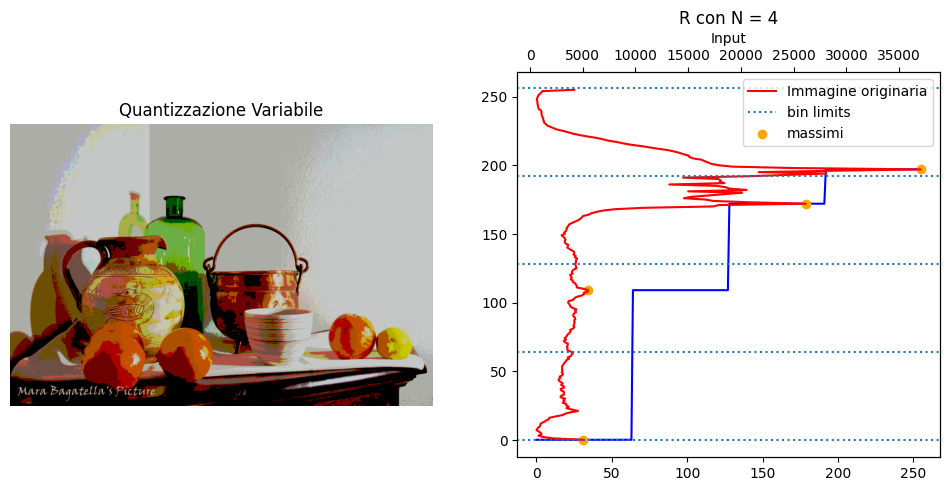

In [ ]:
plt.figure(figsize=(12, 5))
plt.tight_layout()

maxs_R = find_maxs(hist_R,N)
maxs_G = find_maxs(hist_G,N)
maxs_B = find_maxs(hist_B,N)

img_max_separate = img_from_channels(
        R=quantize(R,maxs=maxs_R),
        G=quantize(G,maxs=maxs_G),
        B=quantize(B,maxs=maxs_B),
        )

show_img(img_max_separate, 121,'Quantizzazione Variabile')

plot_dynamic_quantization(122,hist_R,maxs=maxs_R,title=f'R con N = {N}',color='red')

Come possiamo notare, anche questo approccio risulta poco efficace:<br>
il risultato si discosta nuovamente in modo "sospetto" dall' immagine Sorgente.

Proviamo infine con la quantizzazione dinamica.

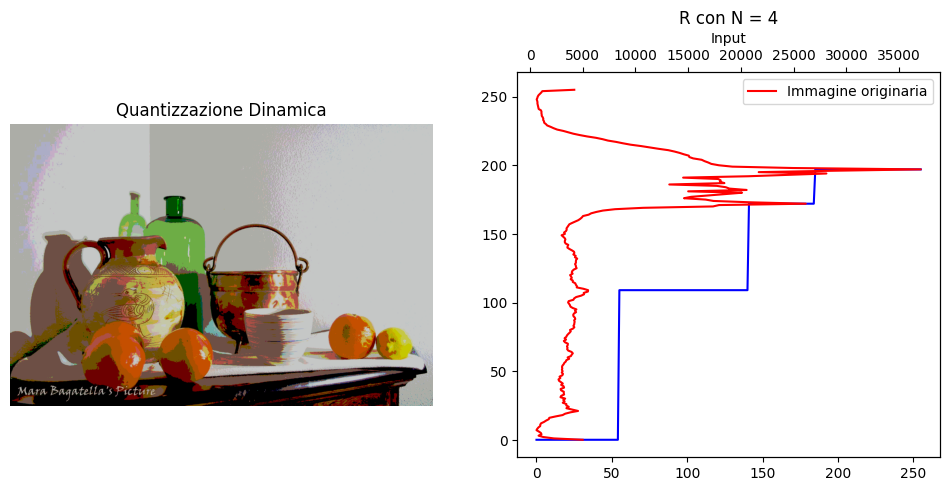

In [ ]:
plt.figure(figsize=(12, 5))
plt.tight_layout()


img_max_ranges_separate = img_from_channels(
        R=quantize(R,maxs_ranges=maxs_R),
        G=quantize(G,maxs_ranges=maxs_G),
        B=quantize(B,maxs_ranges=maxs_B),
        )

show_img(img_max_ranges_separate, 121,'Quantizzazione Dinamica')
plot_dynamic_quantization(122,hist_R,maxs_ranges=maxs_R,title=f'R con N = {N}',color='red')

Mettendo a paragone le 3 immagini, notiamo come effettivamente il risultato sia sempre "migliore", anche se **errato**.

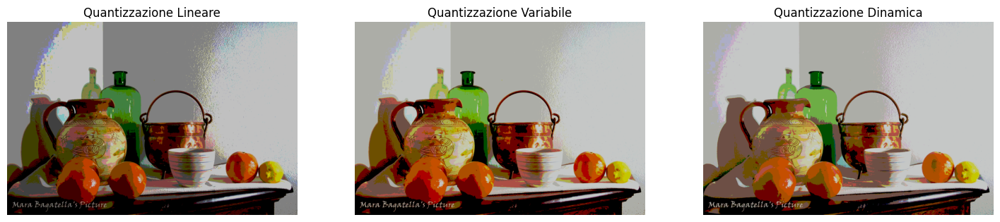

In [ ]:
plt.figure(figsize=(18, 5))
plt.tight_layout()


show_img(img_flat_separate, 131,'Quantizzazione Lineare')
show_img(img_max_separate, 132,'Quantizzazione Variabile')
show_img(img_max_ranges_separate, 133,'Quantizzazione Dinamica')

# Quantizzazione RGB con studio composto


Osservando La immagini ottenuto dallo studio dei 3 canali presi separatamente, è immediato accorgersi che qualcosa **non funzioni** correttamente.

Cerchiamo allora di capire la natura di Questo problema, con un esempio.

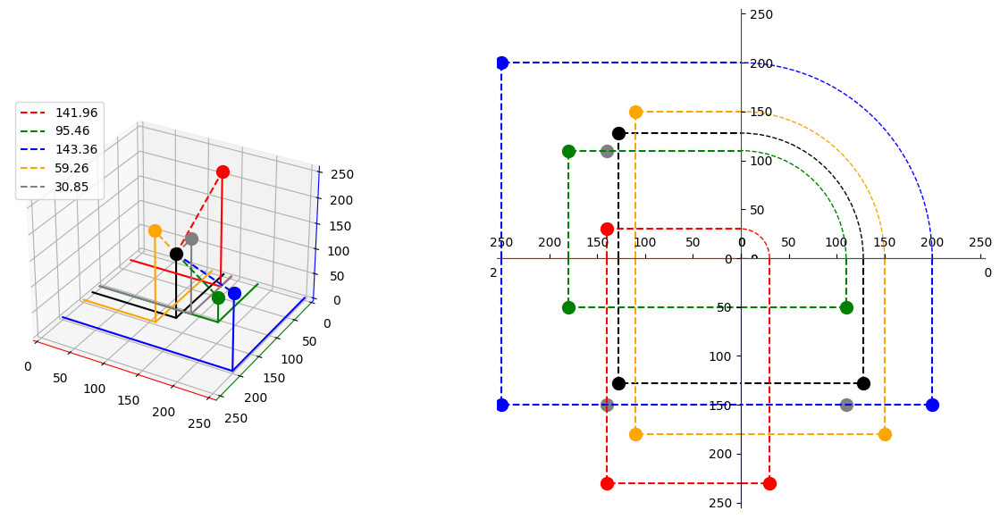

In [ ]:
# @title Errore quantizzazione separata

points = {
    'P': (np.array([128, 128, 128]), 'black'),
    'PR': (np.array([140, 30, 230]), 'red'),
    'PG': (np.array([180, 110, 50]), 'green'),
    'PB': (np.array([250, 200, 150]), 'blue'),
    'PBEST': (np.array([110, 150, 180]), 'orange')
}

plot_wrong_approssimation(points)

Supponiamo di avere una "palette di colori", ovvero un insieme di colori che rappresentano il codominio della trasformazione (ovvero i colori che ci saranno nell' immagine in output).

Supponiamo di avere un pixel (BLACK) che vogliamo sia approssimato al suo colore più vicino, in distanza euclidiana.

I colori che compongono la palette sono indicati come punti di colore RED, GREEN, BLUE e ORANGE.


Osservando il grafico tridimensionale, notiamo come il colore "atteso" sia quello ORANGE, in quanto più vicino.

Supponiamo ora di calcolare separatamente le 3 coordinate del colore atteso, dividendo in valore di R, G e B.

Guardando la Proiezione Ortogonale sulla destra, nostiamo come lungo l' asse R il valore "migliore" sia quello del punto RED, per l' asse G quello di GREEN e per l' asse B quello di BLUE.

Come approssimazione otteniamo quindi l' "artefatto" GRAY, di coordinate

GRAY = [ RED[R], GREEN[G], BLUE[B] ]

Possiamo allora a questo punto capire come mai, nella quantizzazione a canali separati, il muro avesse quei colori "strani".

Proviamo allora a quantizzare i 3 canali in contemporanea.

Per fare questo, bisogna intanto andare a calcolare un "istogramma 3D" che descriva la distribuzione di probabilità dei colori presenti nell' immagine.

Per visualizzarla, "tagliamo" la matrice lungo l' asse R.

In [ ]:
#creo la matrice delle probabilità
matrix,_ = istogram_3d(img_RGB)
frames = generate_frames_hist_3d(matrix,hist_G=hist_G,hist_B=hist_B)
video_name = 'notebook/RGB matrix.mp4'
display_video(save_file(video_name,frames,fps=8),interval=125,dim=(8,8))

Calcoliamo la quantizzazione lineare: <br>
questa risulta identica alla versione coi 3 canali separati, in quanto consiste nel calcolare a che "sotto-cubo" appartiene il punto, e approssimarlo all' angolo con la tripletta con valori minori.


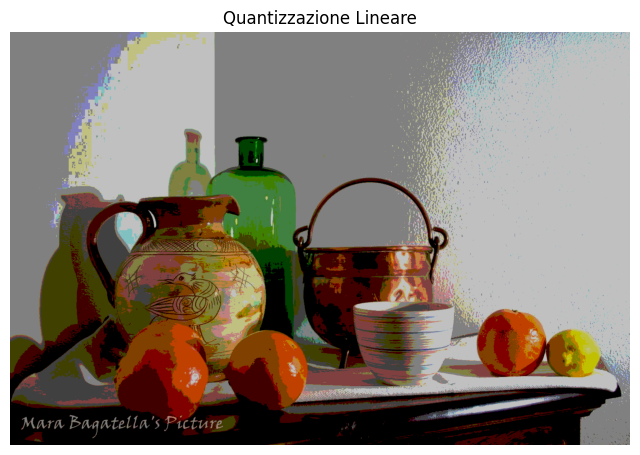

In [ ]:
plt.figure(figsize=(8,8))

N=4
img_flat_unite = quantize_3d(img_RGB,N=N)

show_img(img_flat_unite, 111,'Quantizzazione Lineare')

Proviamo poi a scegliere a run-time i rappresentanti (Quantizzazione Variabile).


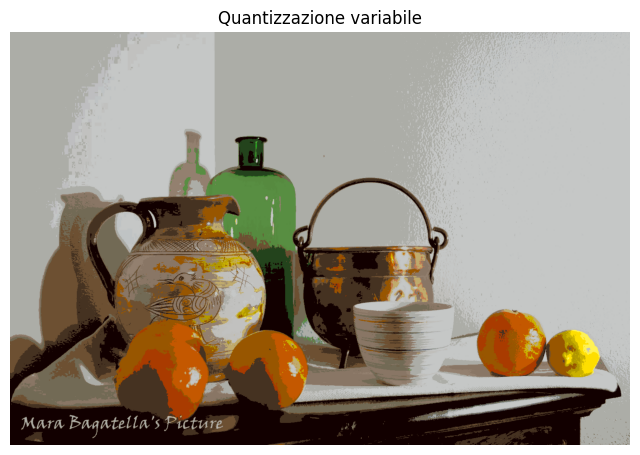

In [ ]:
plt.figure(figsize=(8, 8))

maxs_3d = find_maxs_3d(matrix,N)
img_max_unite = quantize_3d(img_RGB,maxs = maxs_3d)

show_img(img_max_unite, 111,'Quantizzazione variabile')

Per quanto riguarda la "quantizzazione variabile", in cui andiamo ad approssimare ogni colore al "massimo" del suo bin, osserviamo dei miglioramenti: **Non sono più creati artefatti**.

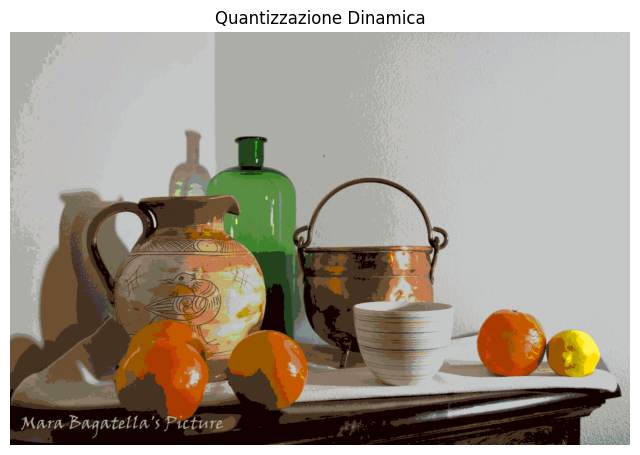

In [ ]:
plt.figure(figsize=(8, 8))
img_max_ranges_unite = quantize_3d(
    img_RGB,
    maxs_ranges = maxs_3d,
    lookahead_matrix = np.full((256, 256, 256, 3), -1, dtype=int))

show_img(img_max_ranges_unite, 111,'Quantizzazione Dinamica')

Paragoniamo infine i risultati ottenuti:
<br> come detto in precedenza, nel caso della quantizzazione lineare non abbiamo differenze, mentre invece nelle altre 2 abbiamo rimosso gli artefatti.

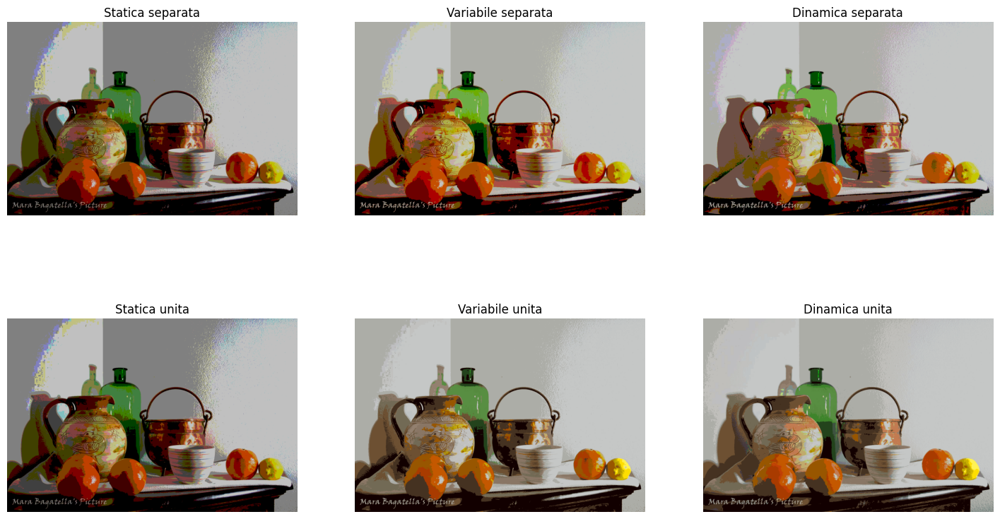

In [ ]:
plt.figure(figsize=(18, 10))
plt.tight_layout()

show_img(img_flat_separate, 231,'Statica separata')
show_img(img_max_separate, 232,'Variabile separata')
show_img(img_max_ranges_separate, 233,'Dinamica separata')

show_img(img_flat_unite, 234,'Statica unita')
show_img(img_max_unite, 235,'Variabile unita')
show_img(img_max_ranges_unite, 236,'Dinamica unita')

# Quantizzazione RGB con Palette


La quantizzazione dinamica sui canali uniti è una buona approssimazione, anche se può succedere che in alcuni bin non ci siano colori utilizzati, e quindi andiamo a fare calcoli inutili.


Possiamo allora provare a indicare "a mano" una palette di colori, e ogni pixel verrà approssimato al "colore" più vicino.

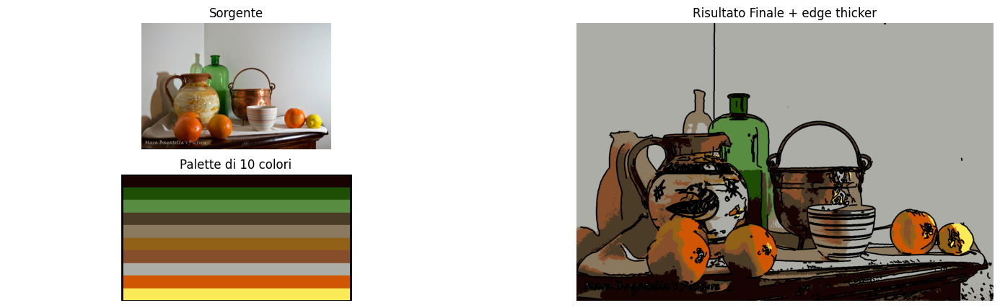

In [ ]:
# @title natura morta
plt.figure(figsize=(18, 5))

img_RGB = img_path("notebook/img_morta.jpg")
img_gray_not_normalized = img_path("notebook/img_morta.jpg",gray= True)
colors = [
    (24, 3, 3),      # tavolo
    (30, 77, 4),     # bottiglia scura
    (88, 140, 65),   # bottiglia
    (75, 60, 40),    # ombre
    (138, 120, 95),  # ombre
    (146, 97, 24),   # vaso chiaro
    (134, 78, 43),   # vaso scuro
    (172, 173, 167), # muro
    (209, 86, 3),    # arancio
    (250, 234, 87)   # limone
]

result = quantize_3d(img_RGB,colors = colors,lookahead_matrix = np.full((256, 256, 256, 3), -1, dtype=int))

show_img(img_RGB, 221,'Sorgente')
show_img(add_edge_RGB(result,edge_detection(img_gray_not_normalized,sigma=1.4,size=2)), 122,'Risultato Finale + edge thicker')
plot_palette(colors,223)

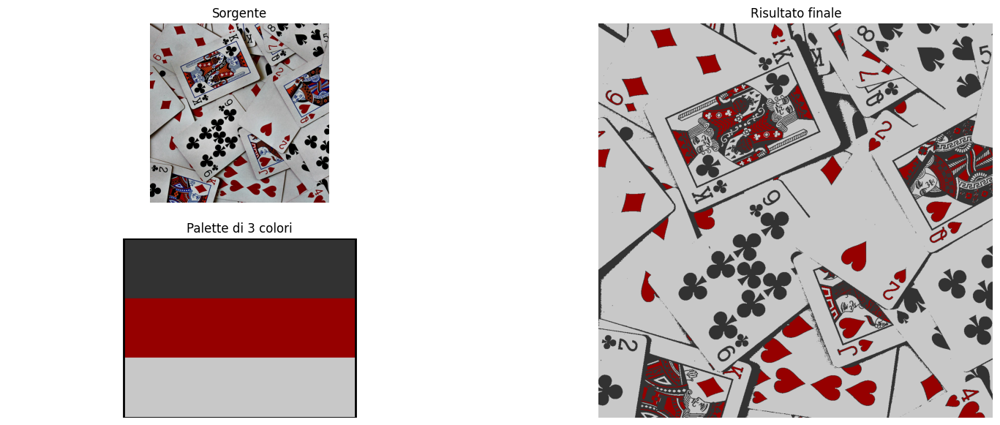

In [ ]:
# @title carte

plt.figure(figsize=(18, 7))
img_RGB = img_path("notebook/carte.jpg").astype(int)
colors = [
    (50,50,50),    #nero
    (150,0,0),     #rosso
    (200,200,200), #carte
    ]

result = quantize_3d(img_RGB,colors=colors,lookahead_matrix = np.full((256, 256, 256, 3), -1, dtype=int))

show_img(img_RGB, 221,'Sorgente')
show_img(result, 122,'Risultato finale')
plot_palette(colors,223)

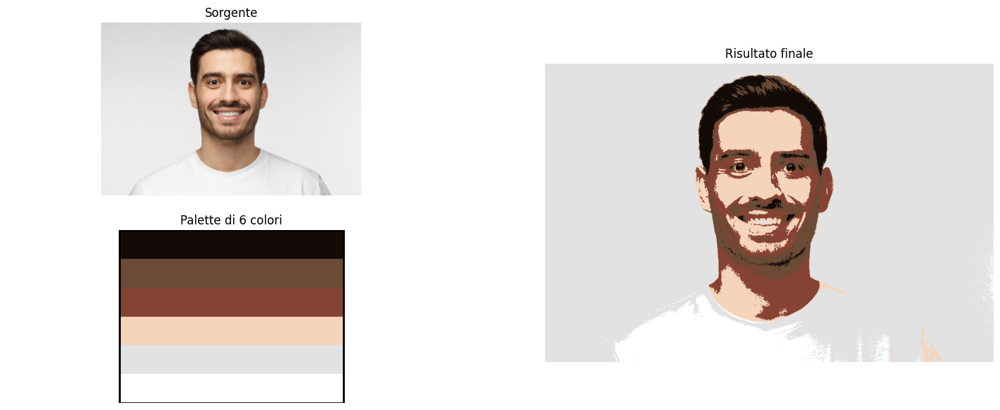

In [ ]:
# @title volto umano

plt.figure(figsize=(18, 7))
img_RGB = img_path("notebook/volto_uomo.jpg").astype(int)
colors = [
    (19, 11, 8),      #nero
    (107, 74, 54),    #marrone capelli
    (134, 66, 51),    #ombre pelle
    (245, 212, 185),  #pelle
    (226, 226, 226),  #sfondo
    (255, 255, 255)   #maglietta
]
result = quantize_3d(img_RGB,colors=colors,lookahead_matrix = np.full((256, 256, 256, 3), -1, dtype=int))

show_img(img_RGB, 221,'Sorgente')
show_img(result, 122,'Risultato finale')
plot_palette(colors,223)

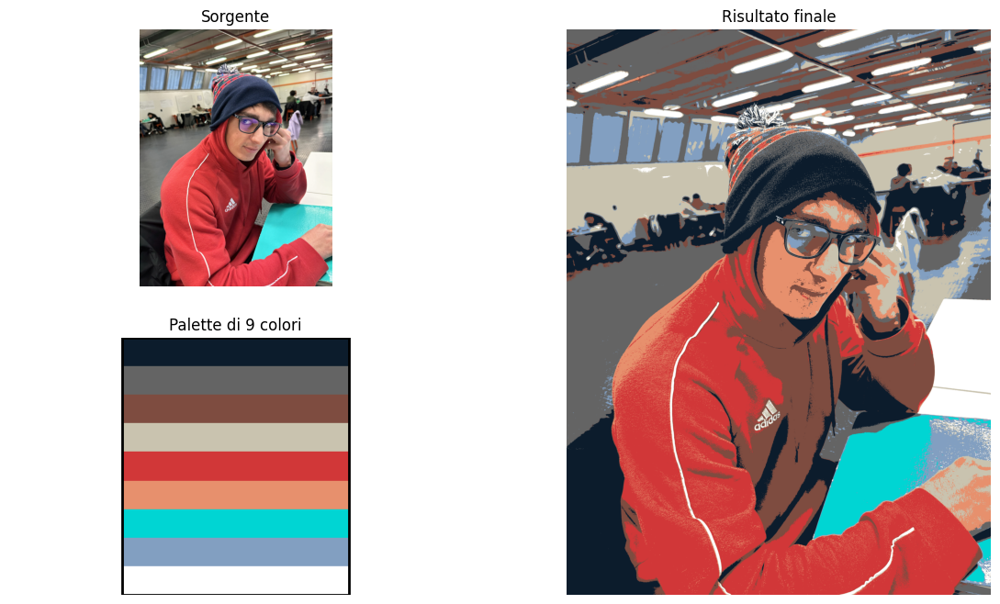

In [ ]:
# @title foto 4k
plt.figure(figsize=(14, 8))
img_RGB = img_path("notebook/luca.JPG").astype(int)
colors = [
    (12, 28, 44),      # cappello
    (100, 100, 100),   # pavimento
    (126, 76, 64),     # pelle scura
    (201, 195, 175),   # muro
    (209, 55, 56),     # felpa
    (231, 144, 109),   # pelle
    (0, 213, 211),     # quaderno
    (130, 159, 193),   # finestre
    (255,255,255)      #luci
]
result = quantize_3d(img_RGB,colors=colors,lookahead_matrix = np.full((256, 256, 256, 3), -1, dtype=int))

show_img(img_RGB, 221,'Sorgente')
show_img(result, 122,'Risultato finale')
plot_palette(colors,223)

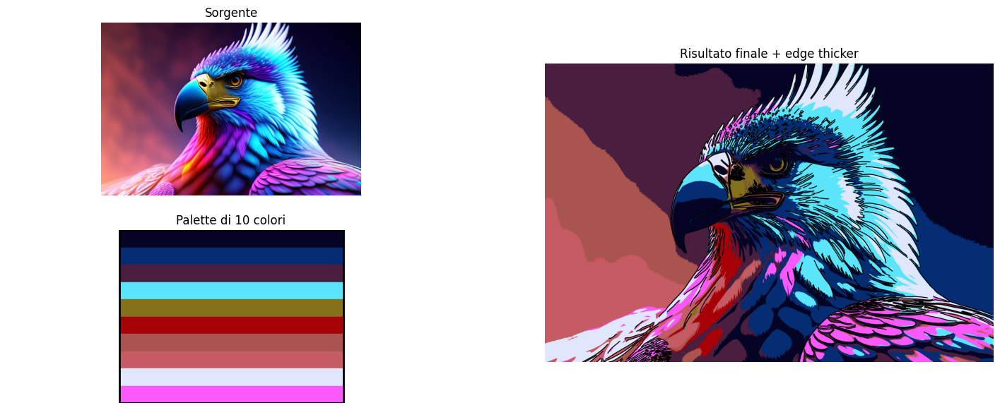

In [ ]:
# @title AI generated
plt.figure(figsize=(18, 7))
img_RGB = img_path("notebook/AI.jpg").astype(int)
img_gray_not_normalized = img_path("notebook/AI.jpg",gray= True)

colors = [
    (5, 4, 36),    # Blu scuro
    (4, 45, 115),  # Blu medio
    (73, 30, 63),  # Borgogna scuro
    (91, 229, 250),# Azzurro chiaro
    (131, 113, 28),# Verde oliva
    (166, 1, 6),   # Rosso scuro
    (170, 84, 79), # Marrone rossastro
    (198, 92, 99), # Rosso rossastro
    (224, 231, 252),# Azzurro chiaro
    (249, 88, 250) # Magenta
]

result = quantize_3d(img_RGB,colors=colors,lookahead_matrix = np.full((256, 256, 256, 3), -1, dtype=int))

show_img(img_RGB, 221,'Sorgente')
show_img(add_edge_RGB(result,edge_detection(img_gray_not_normalized,sigma=3,size=3)), 122,'Risultato finale + edge thicker')

plot_palette(colors,223)